# Explore each columns distribution
This notebook is for data exploration for each columns


In [1]:
import os
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter


import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
#read data, specify index so it's easier to join and search using loc
path = '../../../data/new-york-city-airbnb-open-data/'
listings_csv = os.path.join(path,'selected_columns_listings.csv')
listings = pd.read_csv(listings_csv, index_col = 'id')

In [3]:
#to get all columns, set option
pd.set_option('display.max_columns', 107)
#to get text with no truncation
pd.set_option('display.max_colwidth', -1)

In [4]:
#shape
listings.shape

(29124, 40)

In [28]:
listings.columns

Index(['host_since', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_listings_count',
       'host_verifications', 'host_identity_verified',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'price',
       'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people',
       'number_of_reviews', 'number_of_reviews_ltm', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'cancellation_policy',
       'reviews_per_month', 'last_review_days_ago'],
      dtype='object')

In [5]:
#head
listings.head(1).T

id,2595
host_since,2008-09-09
host_response_time,within a day
host_response_rate,87%
host_acceptance_rate,38%
host_is_superhost,f
host_listings_count,6
host_verifications,"['email', 'phone', 'reviews', 'offline_government_id', 'kba', 'selfie', 'government_id', 'identity_manual', 'work_email']"
host_identity_verified,t
neighbourhood_group_cleansed,Manhattan
latitude,40.7536


host_response_time
a few days or more    604  
within a day          2970 
within a few hours    4615 
within an hour        16830
Name: host_response_time, dtype: int64


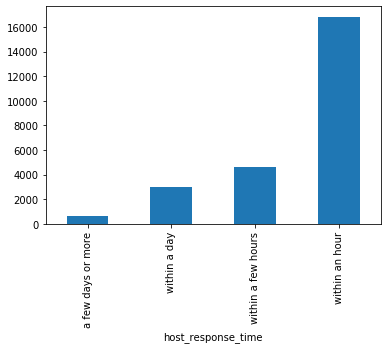

In [8]:
#host_response_time
df = listings.groupby('host_response_time')['host_response_time'].size()
print(df)
df.plot(kind='bar')

#from the data: make two classes, within an hour or more than an hour


host_response_rate
100%    18405
90%     1037 
80%     554  
97%     408  
99%     298  
Name: host_response_rate, dtype: int64


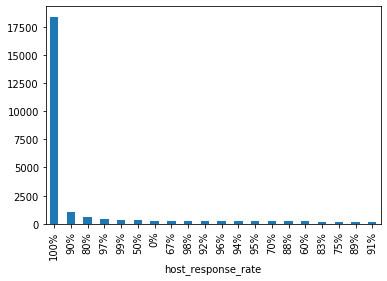

In [27]:
#host_response_rate

df = listings.groupby('host_response_rate')['host_response_rate'].size().sort_values(ascending=False).head(20)
print(df.sort_values(ascending=False).head())
df.plot(kind='bar')

#from the data: looks like majority is 100%, maybe split to 2 classes (100% vs no 100%)

host_acceptance_rate
100%    9412
99%     1918
98%     1488
97%     1149
96%     1087
Name: host_acceptance_rate, dtype: int64


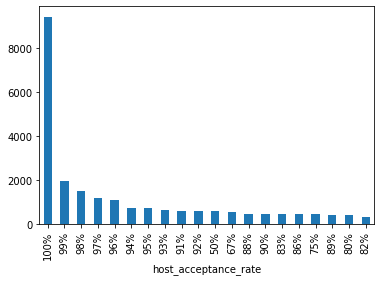

In [25]:
#host_acceptance_rate, top 20

df = listings.groupby('host_acceptance_rate')['host_acceptance_rate'].size().sort_values(ascending=False).head(20)
print(df.head())
df.plot(kind='bar')

#from the data: looks like majority is 100%, maybe split to 2 classes (100% vs no 100%)

host_is_superhost
f    20009
t    9115 
Name: host_is_superhost, dtype: int64


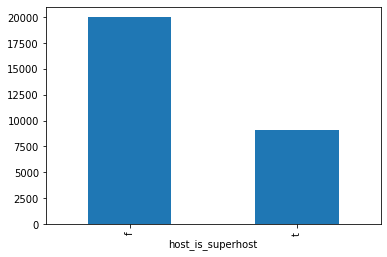

In [30]:
#host_is_superhost

df = listings.groupby('host_is_superhost')['host_is_superhost'].size()
print(df.head())
df.plot(kind='bar')

#from the data: looks like majority is 100%, maybe split to 2 classes (100% vs no 100%)

host_listings_count
1.0    13072
2.0    4918 
0.0    3080 
3.0    2487 
4.0    1344 
Name: host_listings_count, dtype: int64


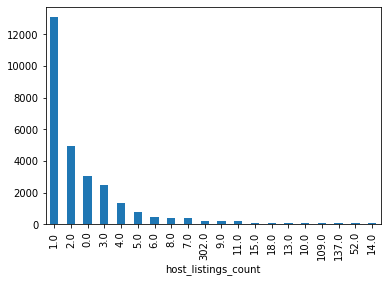

In [32]:
#host_listings_count

df = listings.groupby('host_listings_count')['host_listings_count'].size().sort_values(ascending=False).head(20)
print(df.head())
df.plot(kind='bar')

#mostly one, may create couple classes, 1 and more than 1

host_verifications
['email', 'phone']                                                                           2281
['email', 'phone', 'offline_government_id', 'selfie', 'government_id', 'identity_manual']    2281
['email', 'phone', 'reviews', 'kba']                                                         2207
['email', 'phone', 'reviews', 'jumio', 'government_id']                                      2079
['email', 'phone', 'reviews']                                                                1300
Name: host_verifications, dtype: int64


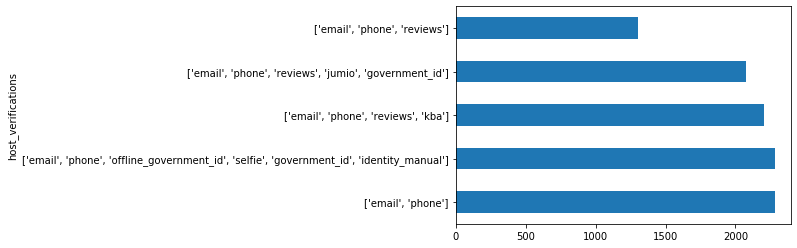

In [38]:
#host_verifications

df = listings.groupby('host_verifications')['host_verifications'].size().sort_values(ascending=False).head(5)
print(df.head())
df.plot.barh()

# we have host verified column, this is redundant

In [36]:
#convert values of host_verifications to list
host_verifications = listings['host_verifications'].values.tolist()

#host verivication split and add to list
host_verification_all = []

for row in host_verifications:
    row_clean = row.replace('[','').replace(']','')
    methods = row_clean.split(',')
    for method in methods:
        method_clean = method.replace("'","").strip()
        host_verification_all.append(method_clean)

Counter(host_verification_all).most_common(10)

[('phone', 29078),
 ('email', 27075),
 ('government_id', 19369),
 ('reviews', 18651),
 ('offline_government_id', 14426),
 ('jumio', 11725),
 ('selfie', 9571),
 ('identity_manual', 8506),
 ('kba', 6091),
 ('facebook', 5481)]

host_identity_verified
f    17200
t    11924
Name: host_verifications, dtype: int64


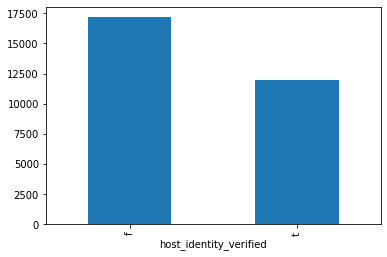

In [41]:
#host_identity_verified
df = listings.groupby('host_identity_verified')['host_verifications'].size()
print(df.head())
df.plot(kind='bar')

neighbourhood_group_cleansed
Bronx            878  
Brooklyn         11935
Manhattan        11819
Queens           4208 
Staten Island    284  
Name: neighbourhood_group_cleansed, dtype: int64


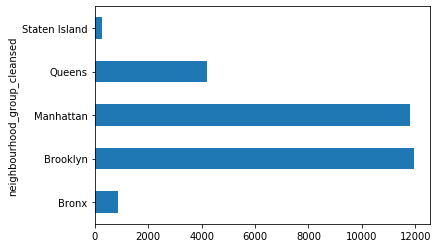

In [44]:
#neighbourhood_group_cleansed
df = listings.groupby('neighbourhood_group_cleansed')['neighbourhood_group_cleansed'].size()
print(df.head())
df.plot.barh()

In [ ]:
# possible removal: 'latitude', 'longitude'

is_location_exact
f    5228 
t    23896
Name: is_location_exact, dtype: int64


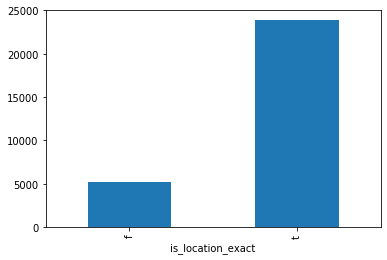

In [46]:
# is_location_exact
df = listings.groupby('is_location_exact')['is_location_exact'].size()
print(df.head())
df.plot(kind='bar')

property_type
Aparthotel           3    
Apartment            21496
Barn                 2    
Bed and breakfast    39   
Boat                 7    
Name: property_type, dtype: int64


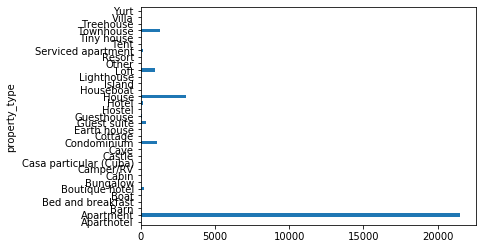

In [47]:
#property_type
df = listings.groupby('property_type')['property_type'].size()
print(df.head())
df.plot.barh()
#looks like mostly apartment, maybe we shouldn't use it, or split to apt vs non apt

room_type
Entire home/apt    15308
Hotel room         270  
Private room       12867
Shared room        679  
Name: room_type, dtype: int64


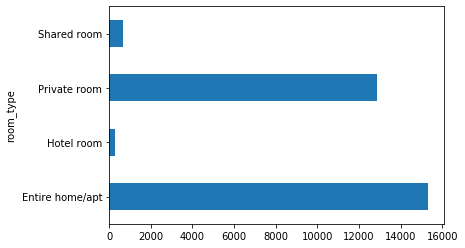

In [48]:
# room_type
df = listings.groupby('room_type')['room_type'].size()
print(df.head())
df.plot.barh()

accommodates
1    3567 
2    13163
3    3211 
4    4656 
5    1334 
Name: accommodates, dtype: int64


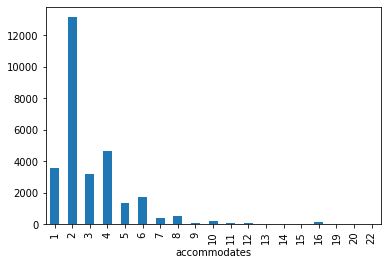

In [49]:
#accommodates
df = listings.groupby('accommodates')['accommodates'].size()
print(df.head())
df.plot(kind='bar')

0.0
15.5


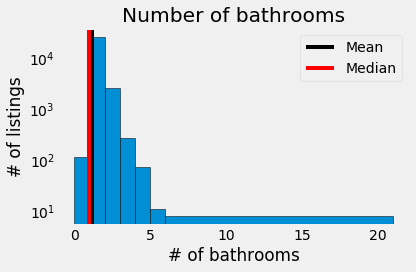

In [60]:
#bathrooms

column = 'bathrooms'

print(listings['bathrooms'].min())
print(listings['bathrooms'].max())

#data is from listings df
number_of_x = listings['bathrooms']
mean = listings['bathrooms'].mean()
median = listings['bathrooms'].median()

bins =  [0,1,2,3,4,5,6, 21]
plt.hist(number_of_x, bins=bins, edgecolor='black', log=True)
plt.axvline(mean, color='black', label='Mean')
plt.axvline(median, color='red', label='Median')

plt.style.use('fivethirtyeight')
plt.title('Number of {}'.format(column))
plt.xlabel('# of {}'.format(column))
plt.ylabel('# of listings')
plt.grid()
plt.tight_layout()
plt.legend()
plt.show()

0.0
21.0


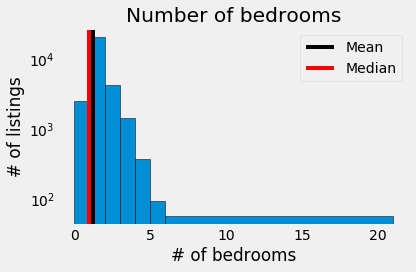

In [61]:
#bedrooms

column = 'bedrooms'

print(listings['bedrooms'].min())
print(listings['bedrooms'].max())

#data is from listings df
number_of_x = listings['bedrooms']
mean = listings['bedrooms'].mean()
median = listings['bedrooms'].median()

bins =  [0,1,2,3,4,5,6, 21]
plt.hist(number_of_x, bins=bins, edgecolor='black', log=True)
plt.axvline(mean, color='black', label='Mean')
plt.axvline(median, color='red', label='Median')

plt.style.use('fivethirtyeight')
plt.title('Number of {}'.format(column))
plt.xlabel('# of {}'.format(column))
plt.ylabel('# of listings')
plt.grid()
plt.tight_layout()
plt.legend()
plt.show()

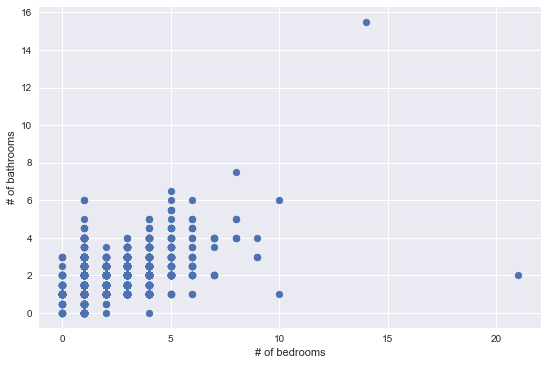

In [68]:
#bed bath and beyond
bed = listings['bedrooms']
bath = listings['bathrooms']

#chart
plt.scatter(bed, bath)
plt.xlabel('# of bedrooms')
plt.ylabel('# of bathrooms')
plt.show()

#this doesn't look like a correlation to me?

beds
0.0    1089 
1.0    16803
2.0    6481 
3.0    2566 
4.0    1170 
Name: beds, dtype: int64


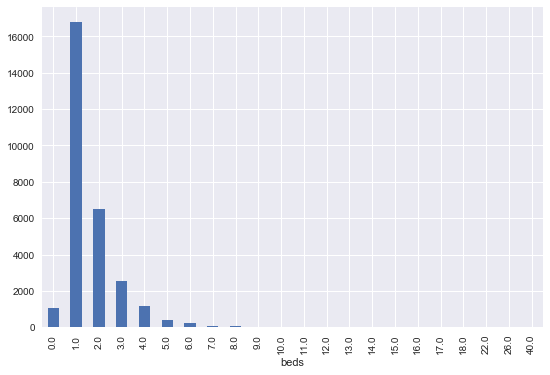

In [70]:
#beds
df = listings.groupby('beds')['beds'].size()
print(df.head())
df.plot(kind='bar')
#majority has 1 or 2.

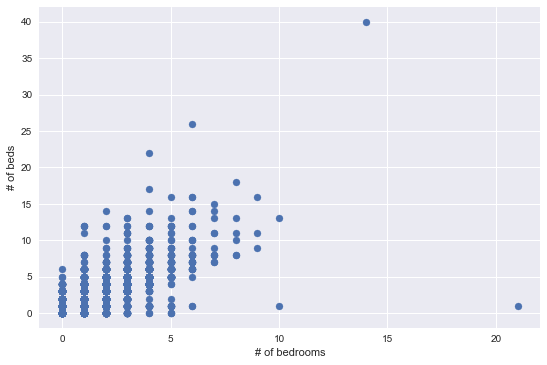

In [73]:
#beds and bedrooms relationship
room = listings['bedrooms']
bed = listings['beds']

#chart
plt.scatter(room, bed)
plt.xlabel('# of bedrooms')
plt.ylabel('# of beds')
plt.show()

#strange but no relationship, I think


bed_type
Airbed           57   
Couch            31   
Futon            134  
Pull-out Sofa    128  
Real Bed         28774
Name: bed_type, dtype: int64


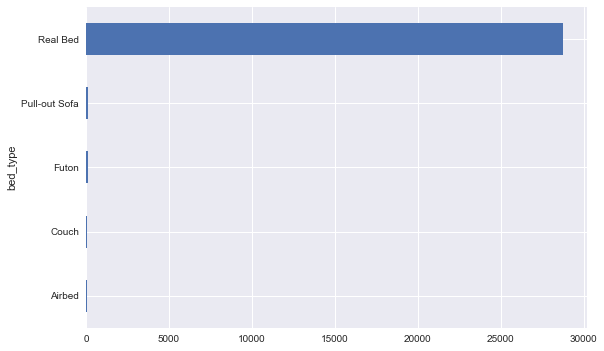

In [76]:
# bed_type
df = listings.groupby('bed_type')['bed_type'].size()
print(df.head())
df.plot.barh()
#Majority is real bed, les't remove this

In [77]:
#amenities
#convert values of amenities to list
amenities = listings['amenities'].values.tolist()

#amenities split and add to list
amenities_all = []

for row in amenities:
    row_string = str(row)
    row_string_clean = row_string.replace('{','').replace('}','')
    amenities_rows = row_string_clean.split(',')
    for row in amenities_rows:
        row_clean = row.replace('"','')
        amenities_all.append(row_clean)

Counter(amenities_all).most_common(5)
#Make another column that counts how many amenities per listing

[('Wifi', 28709),
 ('Heating', 28196),
 ('Essentials', 28083),
 ('Smoke detector', 26628),
 ('Kitchen', 26152)]

guests_included
1    18827
2    6474 
3    903  
4    1839 
5    342  
Name: guests_included, dtype: int64


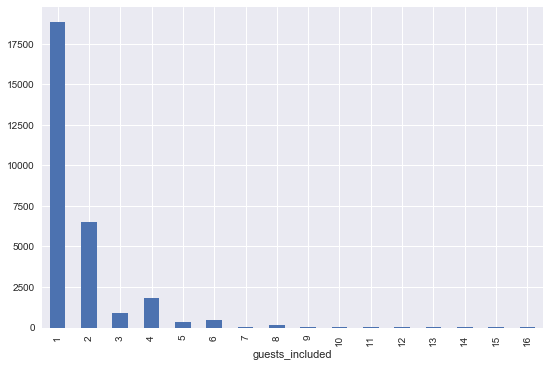

In [82]:
# guests_included
df = listings.groupby('guests_included')['guests_included'].size()
print(df.head())
df.plot(kind='bar')
#majority 1, maybe split into 2 classes?

instant_bookable
f    16704
t    12420
Name: instant_bookable, dtype: int64


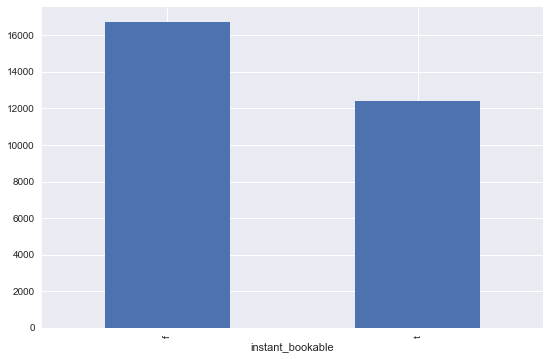

In [83]:
# instant_bookable
df = listings.groupby('instant_bookable')['instant_bookable'].size()
print(df.head())
df.plot(kind='bar')


cancellation_policy
flexible                       5720 
moderate                       7423 
strict                         21   
strict_14_with_grace_period    15930
super_strict_30                21   
Name: cancellation_policy, dtype: int64


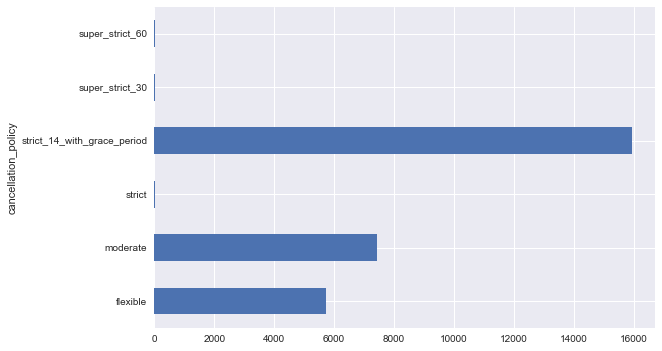

In [85]:
#cancellation_policy
df = listings.groupby('cancellation_policy')['cancellation_policy'].size()
print(df.head())
df.plot.barh()

#let's do 3 classes (flexible, moderate, and strict)

In [87]:
#Currency related
#fill with $0.00
Fill_with_zero = ['security_deposit', 'cleaning_fee']

for column in Fill_with_zero:
    listings[column] = listings[column].replace(np.nan, '$0.00')

In [89]:
#all dollars fields
#function
def fix_currency(row):
    row = row.replace(',', '')
    row = row.replace('$', '')
    return row

In [90]:
colname = 'extra_people'
listings[colname] = listings[colname].apply(lambda col: fix_currency(col)).astype(float)

colname = 'cleaning_fee'
listings[colname] = listings[colname].apply(lambda col: fix_currency(col)).astype(float)

colname = 'security_deposit'
listings[colname] = listings[colname].apply(lambda col: fix_currency(col)).astype(float)

colname = 'price'
listings[colname] = listings[colname].apply(lambda col: fix_currency(col)).astype(float)

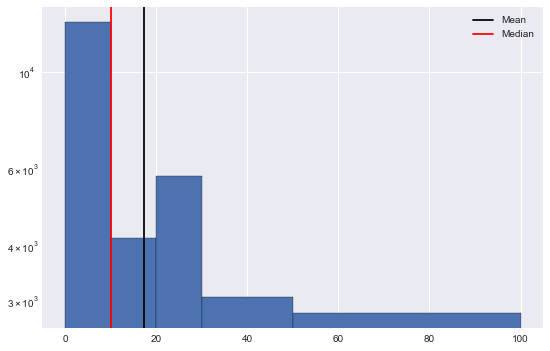

In [100]:
#extra_people
df = listings['extra_people']
bins =  [0,10,20,30,50,100]
mean = df.mean()
median = df.median()

plt.hist(df, bins=bins, edgecolor='black', log=True)
plt.axvline(mean, color='black', label='Mean')
plt.axvline(median, color='red', label='Median')

plt.legend()
plt.show()
#seems ok the way it is

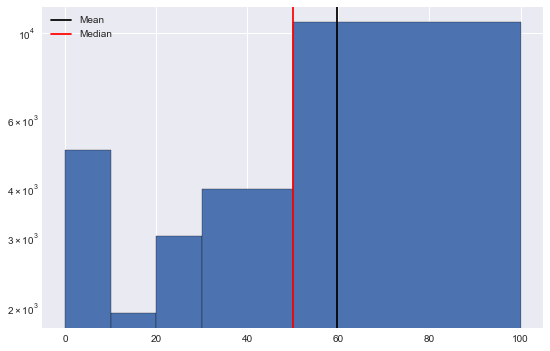

In [101]:
#cleaning_fee
df = listings['cleaning_fee']
bins =  [0,10,20,30,50,100]
mean = df.mean()
median = df.median()

plt.hist(df, bins=bins, edgecolor='black', log=True)
plt.axvline(mean, color='black', label='Mean')
plt.axvline(median, color='red', label='Median')

plt.legend()
plt.show()


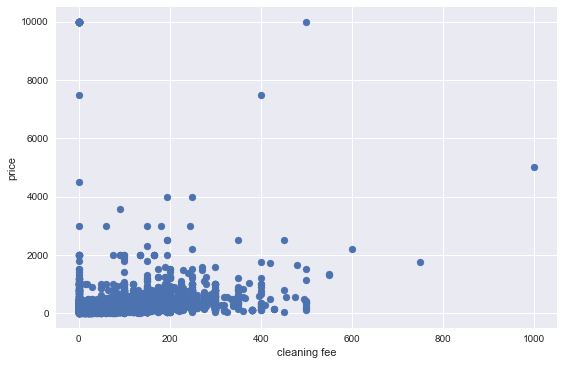

In [102]:
#cleaning service and price
clean_fee = listings['cleaning_fee']
price = listings['price']

#chart
plt.scatter(clean_fee, price)
plt.xlabel('cleaning fee')
plt.ylabel('price')
plt.show()

In [103]:
#turn cleaning fee to yes and no column
def cleaning_fee_yes_no (row):
    if row['cleaning_fee'] > 0.00:
        return '1'
    else:
        return '0'

In [104]:
listings['cleaning_fee_yes_no'] = listings.apply(cleaning_fee_yes_no, axis=1)

In [105]:
listings.groupby('cleaning_fee_yes_no').agg({'price':'mean'})


,price
cleaning_fee_yes_no,
0,201.852941
1,146.563659


In [106]:
#turn security deposit to yes and no column
def security_deposit_yes_no (row):
    if row['security_deposit'] > 0.00:
        return '1'
    else:
        return '0'

In [107]:
listings['security_deposit_yes_no'] = listings.apply(security_deposit_yes_no, axis=1)

In [108]:
listings.groupby('security_deposit_yes_no').agg({'price':'mean'})

,price
security_deposit_yes_no,
0,144.407500
1,169.972002


In [109]:
def extra_people_yes_no (row):
    if row['extra_people'] > 0.00:
        return '1'
    else:
        return '0'

In [110]:
listings['extra_people_yes_no'] = listings.apply(extra_people_yes_no, axis=1)

In [111]:
listings.groupby('extra_people_yes_no').agg({'price':'mean'})

,price
extra_people_yes_no,
0,171.541619
1,144.059607


In [114]:
#accomodates
listings.groupby('accommodates').agg({'cleaning_fee':'mean', 'security_deposit':'mean', 'price':'mean'}).sort_values(by='accommodates',ascending=False)

,cleaning_fee,security_deposit,price
accommodates,,,
22,270.000000,1000.000000,1569.000000
20,270.000000,999.000000,1479.000000
19,240.000000,1000.000000,1369.000000
16,190.991071,414.017857,683.544643
15,185.562500,484.375000,572.125000
14,170.230769,341.153846,404.269231
13,199.166667,954.166667,773.833333
12,179.321839,447.241379,488.264368
11,143.615385,449.871795,346.794872


In [113]:
#darn it, looks like i have to remove any records that acoomodates more than 10 or so
listings.groupby('accommodates')['accommodates'].count().sort_values(ascending=False)

accommodates
2     13163
4     4656 
1     3567 
3     3211 
6     1714 
5     1334 
8     539  
7     362  
10    194  
16    112  
9     89   
12    87   
11    39   
14    26   
15    16   
13    12   
20    1    
19    1    
22    1    
Name: accommodates, dtype: int64

# Looking at price relationship with property types

In [151]:
#filt = listings['property_type'] == 'Hotel'
filt = listings['price'] > 2000
temp = listings[filt]
temp.groupby('property_type')['property_type'].count()
#temp['price'].max()

property_type
Apartment         9 
Boutique hotel    33
Hotel             2 
House             2 
Loft              2 
Townhouse         8 
Name: property_type, dtype: int64

In [152]:
#filt = listings['price'] <2000
filt = listings['room_type'] == 'Hotel room'
temp = listings[filt]
temp.groupby(['property_type', 'room_type'])[['property_type', 'room_type']].count()


,,property_type,room_type
property_type,room_type,,
Aparthotel,Hotel room,2,2
Bed and breakfast,Hotel room,3,3
Boutique hotel,Hotel room,89,89
Hostel,Hotel room,7,7
Hotel,Hotel room,137,137
Resort,Hotel room,1,1
Serviced apartment,Hotel room,31,31


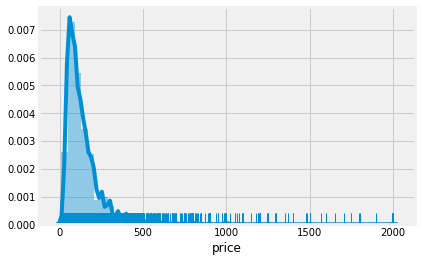

In [153]:
#see in the graph
filt = (listings['price'] < 2000) & (listings['price'] > 0)
sns.distplot(listings['price'][filt], rug=True)

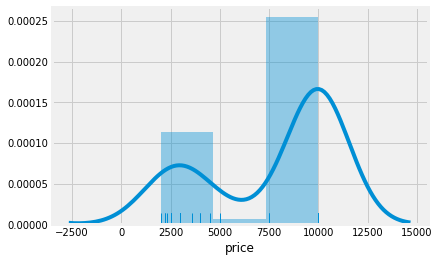

In [154]:
#see in the graph for all price more than 2000
filt = (listings['price'] > 2000) 
sns.distplot(listings['price'][filt], rug=True)

In [155]:
#dropping records with certain property type, mostly hotels and records with bad price (0 or more than 2000)
filt = (~listings['property_type'].isin (['Aparthotel','Bed and breakfast','Boutique hotel',' Hostel', 'Hotel', 'Resort', 'Serviced apartment'])) & (listings['price'] > 0) & (listings['price'] < 2000)

#filt = (listings['price'] < 1000) & (listings['price'] > 20)
listings['property_type'][filt].count()

28444